# Part 2 - ImageIO

## Importing with imread

In [1]:
import imageio
import skimage
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from imageio import imread, imwrite, mimread

In [2]:
# We will use imageio.imread() to import our data
# We can check to see which file formats it will handle
imageio.show_formats()

TIFF - TIFF format [.tif, .tiff, .stk, .lsm]
BMP-PIL - Windows Bitmap [.bmp]
BUFR-PIL - BUFR [.bufr]
CUR-PIL - Windows Cursor [.cur]
DCX-PIL - Intel DCX [.dcx]
DDS-PIL - DirectDraw Surface [.dds]
DIB-PIL - Windows Bitmap []
EPS-PIL - Encapsulated Postscript [.ps, .eps]
FITS-PIL - FITS [.fit, .fits]
FLI-PIL - Autodesk FLI/FLC Animation [.fli, .flc]
FPX-PIL - FlashPix [.fpx]
FTEX-PIL - Texture File Format (IW2:EOC) [.ftc, .ftu]
GBR-PIL - GIMP brush file [.gbr]
GIF-PIL - Static and animated gif (Pillow) [.gif]
GRIB-PIL - GRIB [.grib]
HDF5-PIL - HDF5 [.h5, .hdf]
ICNS-PIL - Mac OS icns resource [.icns]
ICO-PIL - Windows Icon [.ico]
IM-PIL - IFUNC Image Memory [.im]
IMT-PIL - IM Tools []
IPTC-PIL - IPTC/NAA [.iim]
JPEG-PIL - JPEG (ISO 10918) [.jfif, .jpe, .jpg, .jpeg]
JPEG2000-PIL - JPEG 2000 (ISO 15444) [.jp2, .j2k, .jpc, .jpf, .jpx, .j2c]
MCIDAS-PIL - McIdas area file []
MIC-PIL - Microsoft Image Composer [.mic]
MPO-PIL - MPO (CIPA DC-007) [.mpo]
MSP-PIL - Windows Paint [.msp]
PCD-PIL - Ko

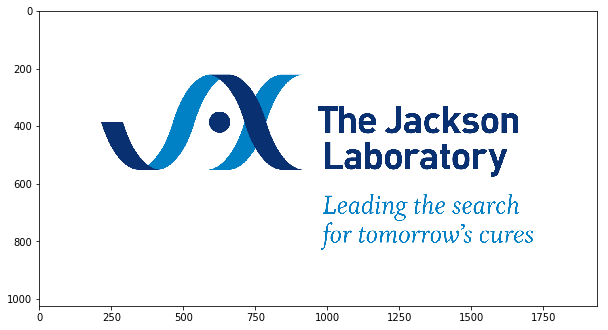

In [3]:
# imread() is simple to use. In most cases, you just need the file path
# Make sure jax.jpeg is in your working directory
# This is usually the same directory as your Jupyter notebook file
jax = imread('../data/jax.jpeg') 

matplotlib.rcParams['figure.figsize'] = [10.0, 10.0] 
plt.imshow(jax);

In [4]:
print('\n # Dimensions: ',jax.ndim,
      '\n        Shape: ', jax.shape,
      '\n         Type: ', jax.dtype)


 # Dimensions:  3 
        Shape:  (1024, 1938, 3) 
         Type:  uint8


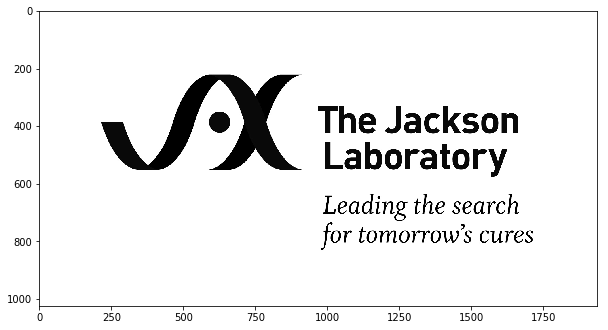

In [5]:
jax_bw = jax[:,:,0] #remember, this is the red channel
plt.imshow(jax_bw, cmap='gray');

In [6]:
# Arrays have the 'T' attribute, which is the transposed data
# transposed = order of axes flipped
print('\n     Normal shape: ', jax_bw.shape,
      '\n Transposed shape: ', jax_bw.T.shape)


     Normal shape:  (1024, 1938) 
 Transposed shape:  (1938, 1024)


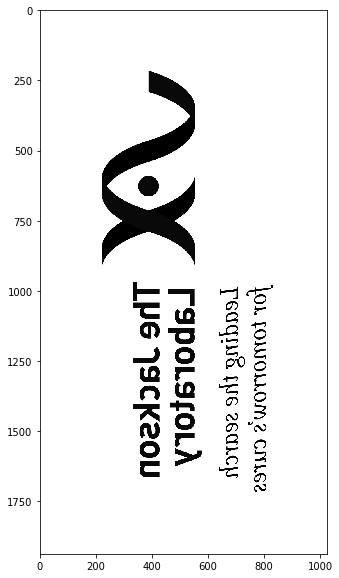

In [7]:
# flipping the axes has the effect of flipping the image along the diagonal
plt.imshow(jax_bw.T, cmap='gray');

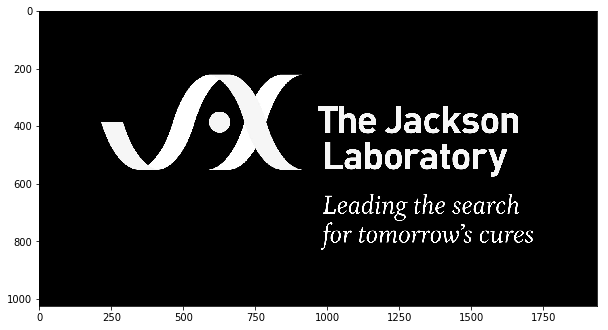

In [8]:
# You can also invert the b&w image
jax_invert = skimage.util.invert(jax_bw)
plt.imshow(jax_invert, cmap='gray');

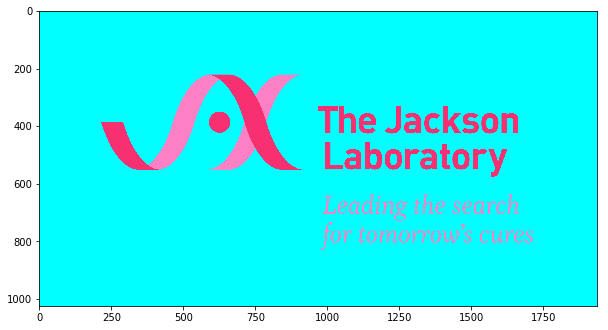

In [9]:
# what happens if we replace the red channel in the original image with the inverted red channel?
jax[:,:,0] = jax_invert
plt.imshow(jax);

In [10]:
# now to write out this new image
# you might get some warnings, but it should work
imwrite('jax2.jpeg', jax)
imwrite('jax2.tif', jax)

/anaconda3/envs/ImPyClass/lib/python3.6/site-packages/imageio/plugins/_tifffile.py:7285: UserWarning: module 'imageio.plugins._tifffile' has no attribute 'decode_packbits'
  Functionality might be degraded or be slow.

  warnings.warn("%s%s" % (e, warn))
/anaconda3/envs/ImPyClass/lib/python3.6/site-packages/imageio/plugins/_tifffile.py:7285: UserWarning: module 'imageio.plugins._tifffile' has no attribute 'decode_lzw'
  Functionality might be degraded or be slow.

  warnings.warn("%s%s" % (e, warn))
/anaconda3/envs/ImPyClass/lib/python3.6/site-packages/imageio/plugins/_tifffile.py:7285: UserWarning: module 'imageio.plugins._tifffile' has no attribute 'unpack_ints'
  Functionality might be degraded or be slow.

  warnings.warn("%s%s" % (e, warn))
/anaconda3/envs/ImPyClass/lib/python3.6/site-packages/imageio/plugins/_tifffile.py:7285: UserWarning: module 'imageio.plugins._tifffile' has no attribute 'reverse_bitorder'
  Functionality might be degraded or be slow.

  warnings.warn("%s%s" %

In [11]:
#Now lets read in an image "stack". This is a 3-dimensional image!
#The different image "planes" in the stack are different focal planes.
#Note that we are using mimread(), not imread()
bf = mimread('../data/bf_stack.tif')

# Image captured by Elise Courtois

In [12]:
#unfortunately mimread() creates a list of 2D images, not a 3D image
print('\n            Type: ', type(bf),
      '\n # items in list: ', len(bf))


            Type:  <class 'list'> 
 # items in list:  40



 # dimensions:  2 
        shape:  (442, 422)


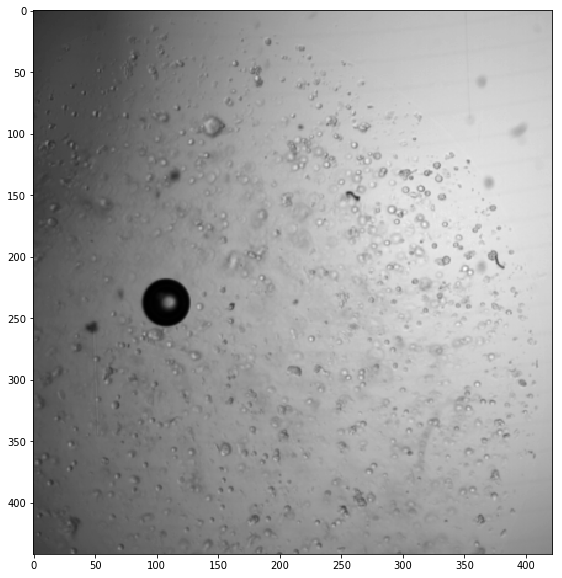

In [13]:
# peek at the first image in the stack
plt.imshow(bf[0], cmap='gray');
print('\n # dimensions: ', bf[0].ndim,
      '\n        shape: ', bf[0].shape)

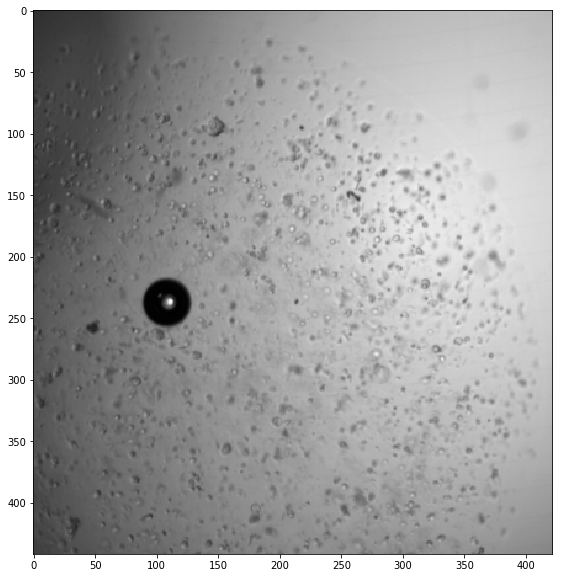

In [14]:
# here is a deeper focal plane
plt.imshow(bf[10], cmap='gray');

In [15]:
# we can make a volume manually
bf_vol = np.zeros([442, 422, 40], dtype='uint8')
i = 0
for x in bf:
    bf_vol[:,:,i] = x
    i += 1
    
print('\n # dimensions: ', bf_vol.ndim,
      '\n        shape: ', bf_vol.shape)


 # dimensions:  3 
        shape:  (442, 422, 40)


## Exercises

1. Produce max and min projections for `bf_vol` along each axis, and save each as a tif.
2. Create a max projection (axis=2) of a color-inverted `bf_vol` and crop it to the lower left quadrant.
3. Save the output of \#2 as a jpeg.

In [16]:
bf_max_0 = bf_vol.max(axis=0)
bf_max_1 = bf_vol.max(axis=1)
bf_max_2 = bf_vol.max(axis=2)

bf_min_0 = bf_vol.min(axis=0)
bf_min_1 = bf_vol.min(axis=1)
bf_min_2 = bf_vol.min(axis=2)

imwrite('bf_max_0.tif', bf_max_0)
imwrite('bf_max_1.tif', bf_max_1)
imwrite('bf_max_2.tif', bf_max_2)

imwrite('bf_min_0.tif', bf_min_0)
imwrite('bf_min_1.tif', bf_min_1)
imwrite('bf_min_2.tif', bf_min_2)

(221, 211)

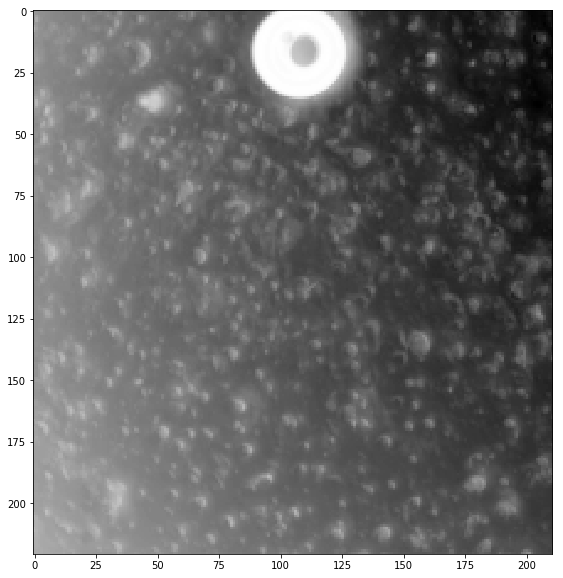

In [17]:
bf_invert = skimage.util.invert(bf_vol)
bf_inv_max = bf_invert.max(axis=2)
bf_inv_max_crop = bf_inv_max[221:442, 0:211]
plt.imshow(bf_inv_max_crop, cmap='gray');
bf_inv_max_crop.shape

In [18]:
imwrite('bf_inv_max_crop.jpeg', bf_inv_max_crop)

## Working with PIL Image file objects

In [19]:
import sys
from PIL import Image, ImageEnhance

In [20]:
# when we are loading in images is numpy.ndarrays, they take up a good chunk of memory
# this can be a problem for very large image files
print('\n           type: ', type(bf_vol),
      '\n size in memory: ', sys.getsizeof(bf_vol))


           type:  <class 'numpy.ndarray'> 
 size in memory:  7461088


In [21]:
# Instead we can open the image file and keep it accessible as a PIL Image file object
# This is really a file handle and contains very little data itself
bf2 = Image.open('../data/bf_stack.tif')

In [22]:
# This has a very small memory footprint
print('\n           type: ', type(bf2),
      '\n size in memory: ', sys.getsizeof(bf2))


           type:  <class 'PIL.TiffImagePlugin.TiffImageFile'> 
 size in memory:  56


In [23]:
# You can get a lot of information about the file without loading it into memory
print('\n           file format: ', bf2.format_description,
      '\n image planes in stack: ', bf2.n_frames,
      '\n               xy size: ', bf2.size)


           file format:  Adobe TIFF 
 image planes in stack:  40 
               xy size:  (422, 442)


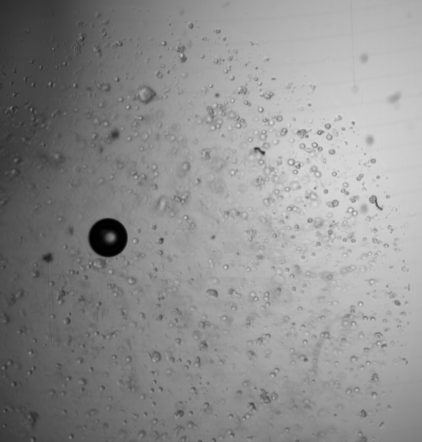

In [24]:
# entering bf2 give you the first focal plane of the image
bf2

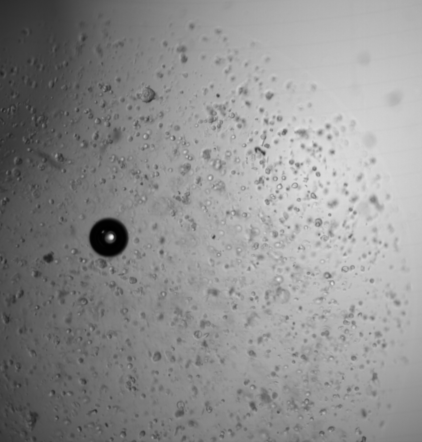

In [25]:
# If you want a different plane, use the seek() function
bf2.seek(10) #move the file pointer to plane #10
bf2

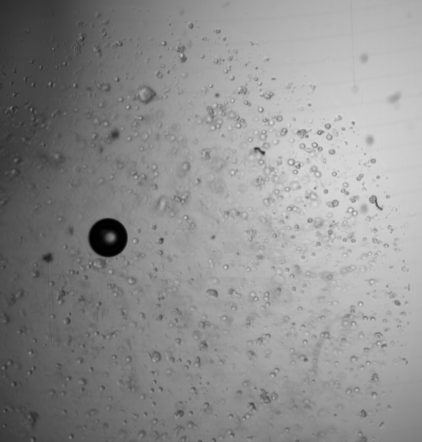

In [26]:
bf2.seek(0) #move the file pointer back to 0
bf2

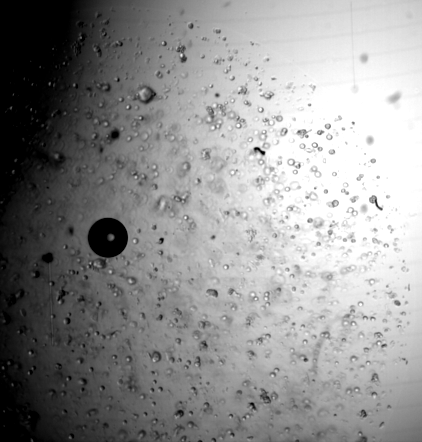

In [27]:
# PIL has a great toolkit for manipulating images
# Here is an example of enhancing contrast
bf2_e = ImageEnhance.Contrast(bf2).enhance(2)
bf2_e

In [28]:
# This doesn't work. Why?
bf2_e.seek(10)

EOFError: 

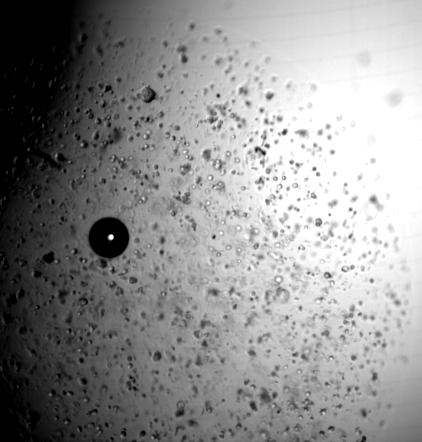

In [29]:
bf2.seek(12) #try playing with this value
bf2_e = ImageEnhance.Contrast(bf2).enhance(factor=2)
bf2_e

In [30]:
# The Contrast() function is only working on a plane at a time
bf2_e.size

(422, 442)

In [31]:
# We can build a list of ehanced planes
# Remember mimread() also created a list of planes
bf2_e_list = []

for i in range(0, bf2.n_frames):
    bf2.seek(i)
    newframe = ImageEnhance.Contrast(bf2).enhance(factor=2)
    bf2_e_list.append(newframe)

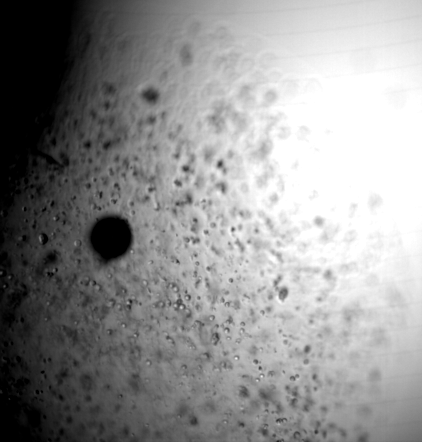

In [32]:
bf2_e_list[34] #play with the index to check different planes

In [33]:
# You can use the save function to save the list of images as a new tif stack
bf2_e_list[0].save("bf2_stack_enhanced.tif", save_all=True, append_images=bf2_e_list[1:])

In [34]:
# When you're done with a PIL image file object, be sure to close it!
bf2.close()

## Exercise

1. Apply a sharpness enhancement to bf2_stack_enhanced.tif and save the results.
    * Use `ImageEnhance.Sharpness()` with factor=3. This should work exactly like the contrast enhancement above.

In [35]:
bf3 = Image.open('bf2_stack_enhanced.tif')
bf3_e_list = []

for i in range(0, bf3.n_frames):
    bf3.seek(i)
    newframe = ImageEnhance.Sharpness(bf3).enhance(factor=3)
    bf3_e_list.append(newframe)
    
bf3.close()

In [36]:
bf3_e_list[0].save("bf3_stack_enhanced.tif", save_all=True, append_images=bf3_e_list[1:])

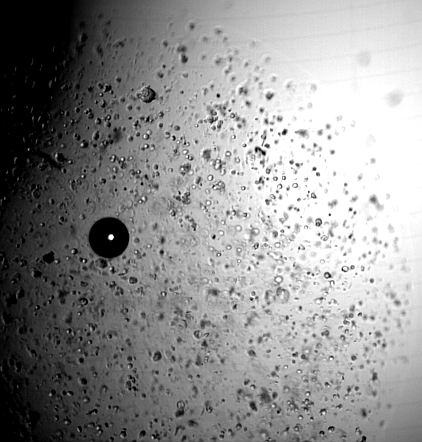

In [37]:
bf3_e_list[12]

## Large files - Demo only

### Lets take a look at a ___really___ big image file

In [38]:
ls -hl ../data/GB.tif #This is a shell command, not Python!

-rw-r--r--@ 1 djme  JAX\Domain Users   1.4G Mar 23  2018 ../data/GB.tif


### What happens to your RAM when you open using imread()?

In [39]:
big_mem = imread('../data/GB.tif')

In [40]:
big_mem2 = big_mem.copy() #This doubles the memory footprint!

In [41]:
sys.getsizeof(big_mem2)

1539414808

### Lets restart the kernel and try using the PIL IO functions

In [42]:
from PIL import Image, ImageEnhance

In [43]:
# First need to turn off a safety feature to read in really big images
Image.MAX_IMAGE_PIXELS = None

In [44]:
big = Image.open('../data/GB.tif')

# Image from the Kaczorowski lab

In [45]:
print('\n           file format: ', big.format_description,
      '\n image planes in stack: ', big.n_frames,
      '\n               xy size: ', big.size)


           file format:  Adobe TIFF 
 image planes in stack:  1 
               xy size:  (35124, 43828)


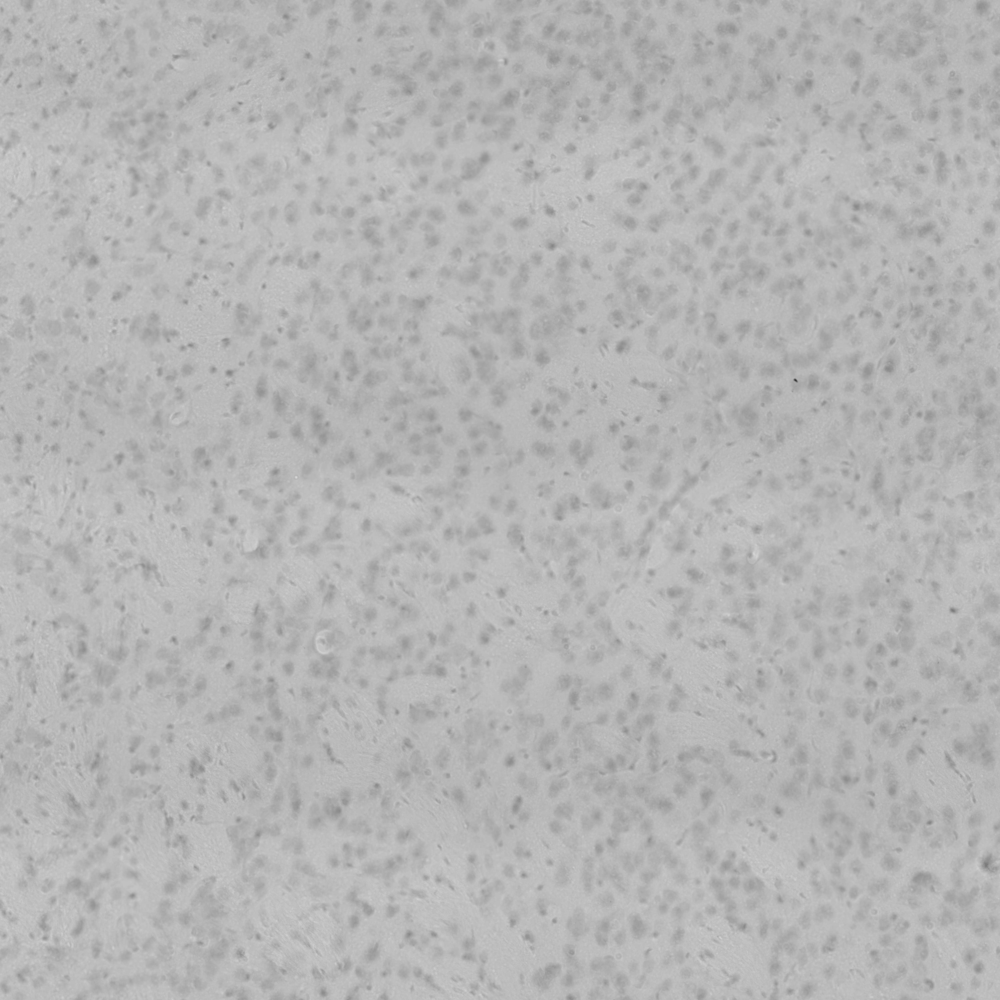

In [46]:
# You can crop out parts of the larger image without loading the whole image into memory
big.crop([15000,15000,20000,20000])

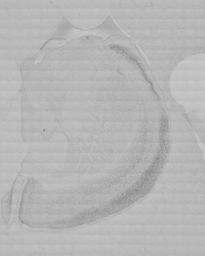

In [47]:
# You can also make a thumbnail to look at the whole image
# But this changes the original image file object
big.thumbnail(size=[256,256])
big

In [48]:
new_big = Image.open('../data/GB.tif')

In [49]:
# You can load this image into memory if you want to
big_thumb = new_big.copy()

In [50]:
# this shrinks the copy in place, freeing up memory
big_thumb.thumbnail(size=[256,256])
print('\n     xy size: ', big_thumb.size)


     xy size:  (205, 256)


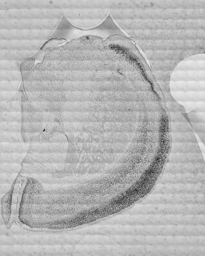

In [51]:
# because big_thumb is already pretty small, this does not impact memory much
ImageEnhance.Contrast(big_thumb).enhance(3)

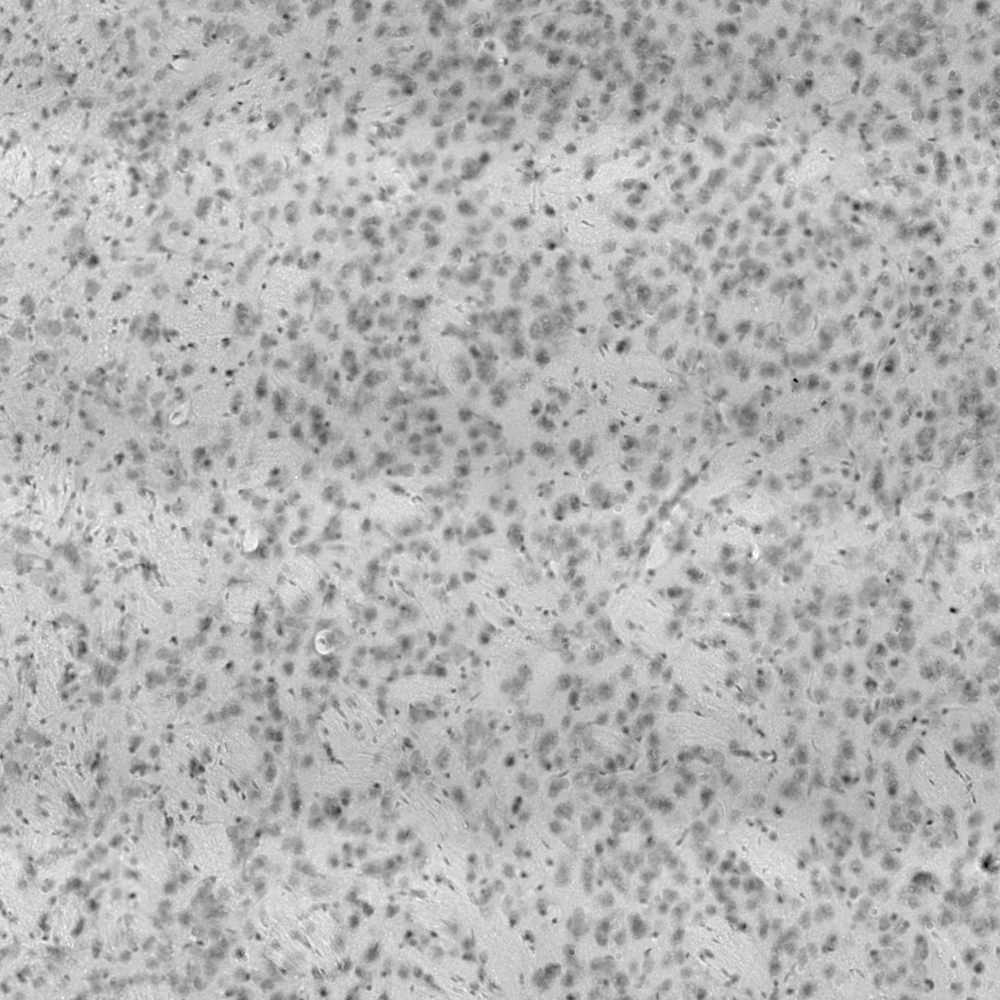

In [52]:
# This will only a return a crop of the full image
# But the Contrast() function has to create a whole copy of the image first
# So memory will spike, then come back down
ImageEnhance.Contrast(new_big).enhance(3).crop([15000,15000,20000,20000])

In [53]:
# This keeps a copy of the enhanced image in memory
big_enhanced = ImageEnhance.Contrast(new_big).enhance(3)

In [54]:
# And this gives you your memory back
big_enhanced.close()